# **Data Download from Kaggle**

Download the data from kaggle and unzip it to get acess to the data file (Train.csv)

In [ ]:
! kaggle datasets download prachi13/customer-analytics

Dataset URL: https://www.kaggle.com/datasets/prachi13/customer-analytics
License(s): other
100% 121k/121k [00:00<00:00, 369kB/s]
100% 121k/121k [00:00<00:00, 369kB/s]


In [ ]:
! unzip /content/customer-analytics.zip

Archive:  /content/customer-analytics.zip
  inflating: Train.csv               


# **Data Initialization**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

The dataset is about e-commerce shipping logistics, presenting information about shipments and their delivery outcomes. It contains 10,999 rows, each showing shipment data with features such as 'warehouse block', 'shipping mode', 'customer care interactions', 'customer ratings', 'product cost', 'prior purchases', and 'discounts offered'. It also contains details about the product's 'importance level', 'customer’s gender', and 'product's weight'. The column 'Reached.on.Time_Y.N' indicates whether the shipment arrived on time, making the dataset suitable for predictive analysis related to delivery performance.

This dataset can be used to explore patterns and trends in e-commerce shipping operations. Analysts can investigate factors influencing timely deliveries, such as the role of shipment mode, warehouse management, or customer behavior. Additionally, clustering models can help identify customer or product segments, enabling businesses to optimize logistics strategies, enhance customer satisfaction, and reduce delays. this dataset is good for both descriptive and predictive analytics in logistics and supply chain management.

In [ ]:
df = pd.read_csv('/content/Train.csv')
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10999 entries, 0 to 10998
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   10999 non-null  int64 
 1   Warehouse_block      10999 non-null  object
 2   Mode_of_Shipment     10999 non-null  object
 3   Customer_care_calls  10999 non-null  int64 
 4   Customer_rating      10999 non-null  int64 
 5   Cost_of_the_Product  10999 non-null  int64 
 6   Prior_purchases      10999 non-null  int64 
 7   Product_importance   10999 non-null  object
 8   Gender               10999 non-null  object
 9   Discount_offered     10999 non-null  int64 
 10  Weight_in_gms        10999 non-null  int64 
 11  Reached.on.Time_Y.N  10999 non-null  int64 
dtypes: int64(8), object(4)
memory usage: 1.0+ MB


,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,1,D,Flight,4,2,177,3,low,F,44,1233,1
1,2,F,Flight,4,5,216,2,low,M,59,3088,1
2,3,A,Flight,2,2,183,4,low,M,48,3374,1
3,4,B,Flight,3,3,176,4,medium,M,10,1177,1
4,5,C,Flight,2,2,184,3,medium,F,46,2484,1


In [ ]:
df.describe(include='all')

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,10999.00000,10999,10999,10999.000000,10999.000000,10999.000000,10999.000000,10999,10999,10999.000000,10999.000000,10999.000000
unique,NaN,5,3,NaN,NaN,NaN,NaN,3,2,NaN,NaN,NaN
top,NaN,F,Ship,NaN,NaN,NaN,NaN,low,F,NaN,NaN,NaN
freq,NaN,3666,7462,NaN,NaN,NaN,NaN,5297,5545,NaN,NaN,NaN
mean,5500.00000,NaN,NaN,4.054459,2.990545,210.196836,3.567597,NaN,NaN,13.373216,3634.016729,0.596691
std,3175.28214,NaN,NaN,1.141490,1.413603,48.063272,1.522860,NaN,NaN,16.205527,1635.377251,0.490584
min,1.00000,NaN,NaN,2.000000,1.000000,96.000000,2.000000,NaN,NaN,1.000000,1001.000000,0.000000
25%,2750.50000,NaN,NaN,3.000000,2.000000,169.000000,3.000000,NaN,NaN,4.000000,1839.500000,0.000000
50%,5500.00000,NaN,NaN,4.000000,3.000000,214.000000,3.000000,NaN,NaN,7.000000,4149.000000,1.000000
75%,8249.50000,NaN,NaN,5.000000,4.000000,251.000000,4.000000,NaN,NaN,10.000000,5050.000000,1.000000


# **Data Cleaning**

The dataset is copied to a new variable 'df_numeric' to avoid modifying the original data, ensuring data integrity during preprocessing.


In [ ]:
df_numeric = df.copy()

Encode the Ordinal Feature(s) `Product_importance`
- Convert the ordinal feature `Product_importance` (low, medium, high) into numeric values.
- Use `LabelEncoder` to map the data levels into integers.

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_numeric['Product_importance'] = label_encoder.fit_transform(df_numeric['Product_importance'])

Nominal Features with One-Hot Encoding

- `Warehouse_block`: Represents different warehouse blocks.
- `Mode_of_Shipment`: Indicates the method of shipping (e.g., Flight, Ship, Road).
- `Gender`: Represents customer gender categories (Male, Female).

Encoding
- Apply one-hot encoding to convert these nominal features into binary columns, to avoid creating false ordinal relationships.
- Use `drop_first=True` to avoid multicollinearity by removing one category per feature.

In [ ]:
cat_cols = ['Warehouse_block', 'Mode_of_Shipment', 'Gender']
df_numeric = pd.get_dummies(df_numeric, columns=cat_cols, drop_first=True, dtype=int)

- Use `.info()` to confirm that all features are numeric.
- Use `.head()` to preview the first few rows of the DataFrame for validation.

In [ ]:
df_numeric.info()
df_numeric.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10999 entries, 0 to 10998
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   ID                     10999 non-null  int64
 1   Customer_care_calls    10999 non-null  int64
 2   Customer_rating        10999 non-null  int64
 3   Cost_of_the_Product    10999 non-null  int64
 4   Prior_purchases        10999 non-null  int64
 5   Product_importance     10999 non-null  int64
 6   Discount_offered       10999 non-null  int64
 7   Weight_in_gms          10999 non-null  int64
 8   Reached.on.Time_Y.N    10999 non-null  int64
 9   Warehouse_block_B      10999 non-null  int64
 10  Warehouse_block_C      10999 non-null  int64
 11  Warehouse_block_D      10999 non-null  int64
 12  Warehouse_block_F      10999 non-null  int64
 13  Mode_of_Shipment_Road  10999 non-null  int64
 14  Mode_of_Shipment_Ship  10999 non-null  int64
 15  Gender_M               10999 non-nul

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,Warehouse_block_B,Warehouse_block_C,Warehouse_block_D,Warehouse_block_F,Mode_of_Shipment_Road,Mode_of_Shipment_Ship,Gender_M
0,1,4,2,177,3,1,44,1233,1,0,0,1,0,0,0,0
1,2,4,5,216,2,1,59,3088,1,0,0,0,1,0,0,1
2,3,2,2,183,4,1,48,3374,1,0,0,0,0,0,0,1
3,4,3,3,176,4,2,10,1177,1,1,0,0,0,0,0,1
4,5,2,2,184,3,2,46,2484,1,0,1,0,0,0,0,0


Save a copy of the numeric csv file for future refernce.

In [ ]:
df_numeric.to_csv('Train_numeric.csv')

# **Explarotaory Data Analysis (EDA)**

## Pairplot

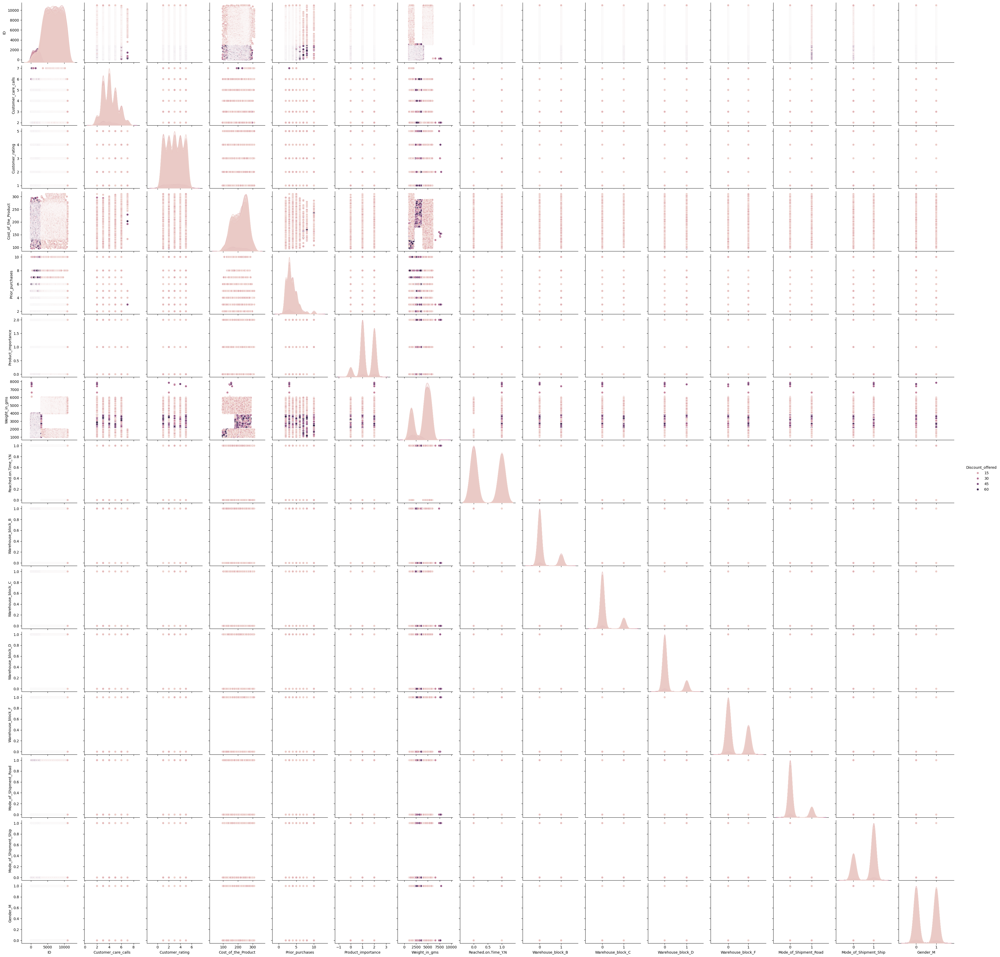

In [ ]:
sns.pairplot(df_numeric, hue='Discount_offered')
plt.savefig('pairplot.png')

### Pairplot Analysis

The pairplot provides key insights into the relationships and distributions of features in the dataset. The scatterplots show clear patterns, with some features displaying linear or curved relationships, suggesting correlations, while others appear sparsely or densely clustered, hinting at distinct groupings suitable for clustering algorithms. One-hot encoded features, such as `Warehouse_block`, `Mode_of_Shipment`, and `Gender_M`, form discrete vertical or horizontal stripes due to their binary nature.

Outliers are noticeable in some plots, which may impact clustering algorithms like KMeans and require handling. Features such as `Discount_offered` and `Cost_of_the_Product` show an inverse relationship, while `Weight_in_gms` exhibits varying clustering behavior when paired with other features.

These observations suggest the need for feature scaling and careful outlier handling to optimize clustering performance.


## Distribution Plot

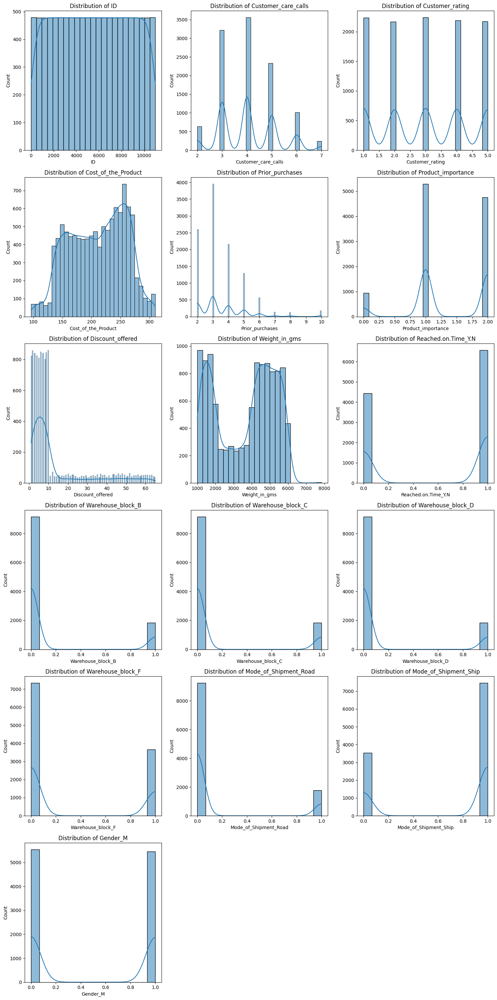

In [ ]:
numeric_columns = df_numeric.select_dtypes(include=['number']).columns

n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df_numeric[column], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)


plt.tight_layout()
plt.savefig('numeric_columns_distribution.png')
plt.show()

### Distribution Plot Analysis

The distribution plots reveal diverse patterns across the dataset. Features like `Customer Care Calls` and `Cost of the Product` exhibit multimodal distributions, indicating distinct customer behaviors or product tiers. `Prior Purchases` is heavily right-skewed, with most customers making a small number of purchases, while `Product Importance` is dominated by a single category. `Discount Offered` is highly skewed, with most values clustered around low discounts, and `Weight in gms` shows a bimodal pattern, reflecting two dominant product weight categories. Binary features, such as `Warehouse Blocks`, `Shipment Modes`, and `Gender`, are imbalanced, with one value dominating.

These insights highlight the need to focus on numerical features like `Cost of the Product` and `Weight in gms` for clustering while ategorical features need careful interpretation during model training.


## Box Plot

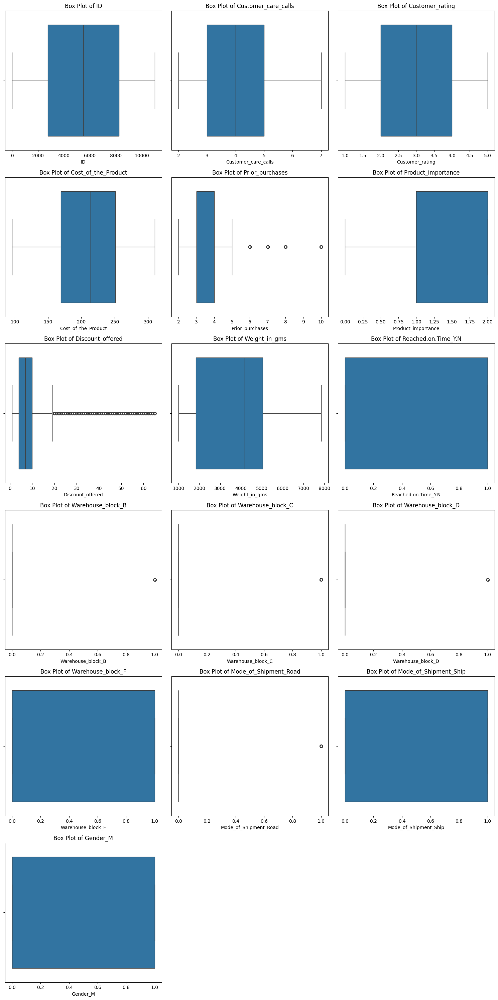

In [ ]:
n_cols = 3
n_rows = (len(numeric_columns) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.boxplot(x=df_numeric[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}')

if len(numeric_columns) < len(axes):
    for j in range(len(numeric_columns), len(axes)):
        axes[j].set_visible(False)

plt.tight_layout()
plt.savefig('numeric_columns_boxplots.png')
plt.show()

### Box Plot Analysis

The box plots provide a visual representation of data distributions and outliers. Features like `Prior Purchases` and `Discount Offered` exhibit several outliers, highlighting rare or extreme cases that may require handling before clustering.

`Cost of the Product` and `Weight in gms` show relatively symmetric distributions with few outliers, suggesting these features are generally well-behaved.

Binary features, such as `Warehouse Block`, `Mode of Shipment`, and `Gender`, show clear categorical behavior, with values concentrated at 0 or 1, as expected.

These insights emphasize the importance of scaling and addressing outliers for numeric features to ensure robust clustering results.


## Correlation Matrix

In [ ]:
corr = df_numeric.corr()

In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool))

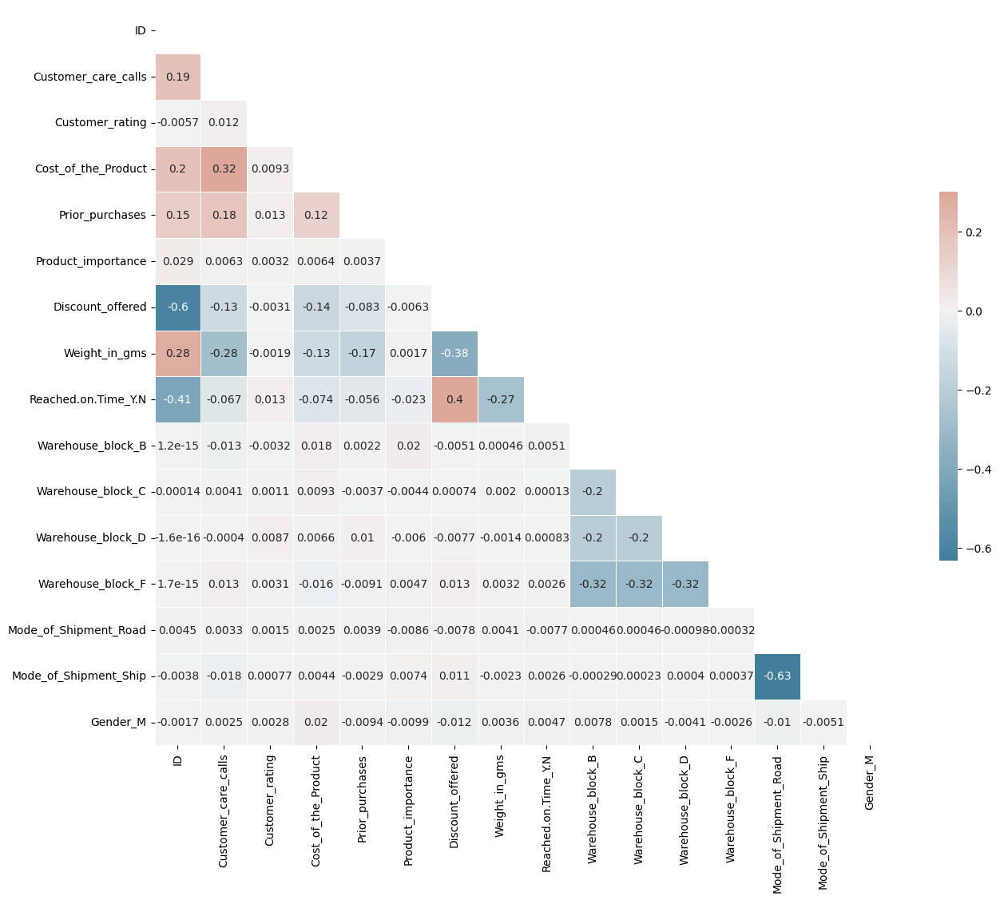

In [ ]:
f, ax = plt.subplots(figsize=(15, 12))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.3, center=0, square=True, linewidths=0.5, cbar_kws={'shrink': 0.5}, annot=True)
plt.savefig('numeric_correlation_matrix.png')


### Correlation Matrix Analysis

The correlation matrix highlights the relationships between features in the dataset. `Discount Offered` shows a strong negative correlation with `Reached.on.Time_Y.N` (-0.41), indicating that higher discounts may be associated with late deliveries. Similarly, `Weight in gms` has a moderate negative correlation with `Reached.on.Time_Y.N` (-0.38), suggesting heavier items might impact delivery time.

Positive correlations are observed between `Customer Care Calls` and `Cost of the Product` (0.20), and between `Weight in gms` and `Cost of the Product` (0.28), reflecting logical dependencies in the data.

Other features show weak or negligible correlations, which suggests minimal redundancy but also indicates limited linear relationships among many variables.

These insights can guide feature selection and engineering for clustering or predictive modeling.


## EDA Insights

   - Features like `Customer Care Calls` and `Cost of the Product` show multimodal distributions, indicating potential clusters.
   - Strong patterns in pairwise scatterplots suggest correlations and separable groups for clustering.
   - `Prior Purchases` and `Discount Offered` exhibit skewed distributions with outliers.
   - `Weight in gms` shows bimodal patterns, indicating two dominant weight categories.
   - Outliers are evident in `Discount Offered` and `Prior Purchases`, which may influence clustering performance.
   - Binary features like `Warehouse Blocks` and `Mode of Shipment` reflect categorical behavior.
   - Strong negative correlation between `Discount Offered` and `Reached.on.Time_Y.N` (-0.41) suggests discounts impact delivery times.
   - Moderate positive correlations exist between `Customer Care Calls`, `Cost of the Product`, and `Weight in gms`.


#**Data Preprocessing**

## Standardize Numerical Features
- Standardizing `Cost_of_the_Product`, `Discount_offered`, `Weight_in_gms` to a common scale, making sure that no feature dominates the clustering process due to range of values.
- Standardization makes sure that all features have a mean of 0 and a standard deviation of 1, making them suitable for clustering algorithms.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df_numeric_scaled = df_numeric.copy()

df_numeric_scaled[['Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']] = scaler.fit_transform(
    df_numeric[['Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']]
    )

## Outlier Detection and Removal
This ensures clean, standardized data for clustering algorithms like KMeans or DBSCAN.

This code identifies and removes outliers from `Cost_of_the_Product`, `Discount_offered`, `Weight_in_gms` using z-scores:

- Z-scores are computed, and rows with absolute z-scores exceeding a threshold (default: `7`) are treated as outliers.
- Outliers are dropped, and the DataFrame index is reset.


In [ ]:
from scipy.stats import zscore

In [ ]:
from scipy.stats import zscore

z_scores = np.abs(zscore(df_numeric_scaled[['Cost_of_the_Product', 'Discount_offered', 'Weight_in_gms']]))

outliers = np.where(z_scores > 7)
outliers_indices = np.unique(outliers[0])

df_numeric_scaled = df_numeric_scaled.drop(outliers_indices).reset_index(drop=True)

#**Clustering**

* Perform clustering on the 'Discount_offered' and 'Weight_in_gms' columns to uncover patterns and group similarities within the data.
* KMeans, K-Medoid, DBSCAN, Mean Shift

# KMeans

KMeans is an unsupervised machine learning algorithm, used to group data into a predefined number of clusters (`k`). The algorithm works by:

- **Initializing Centroids**: Randomly placing `k` centroids in the feature space.
- **Assigning Points to Clusters**: Each data point is assigned to the nearest centroid.
- **Updating Centroids**: Centroids are recalculated as the mean of all points assigned to a cluster.
- **Iterating**: Steps 2 and 3 are repeated until centroids stabilize or maximum iterations are reached.

KMeans aims to minimize inertia, the sum of squared distances between data points and their nearest centroid, producing compact and distinct clusters.


In [ ]:
from sklearn.cluster import KMeans

###**Elbow Method**:
**Intertia**
   - The inertia (the sum of squares within a cluster) is calculated for clusters ranging from 2 to 14.
   
**silhouette score**
- The silhouette score measures the quality of clustering. It ranges from -1 to 1:
     - Values closer to 1 indicate well-separated clusters.
     - Values near 0 suggest overlapping clusters.
     - Negative values imply misclassified clusters.


In [ ]:
inertia = []
silhouette_scores = []

for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, random_state=79)
    kmeans.fit(df_numeric_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_numeric_scaled, kmeans.labels_))

**Elbow Method Graph**:
- The Elbow Method graph shows how inertia decreases as the number of clusters increases. A sharp "elbow" in the graph (around `k=3`) suggests the optimal number of clusters.

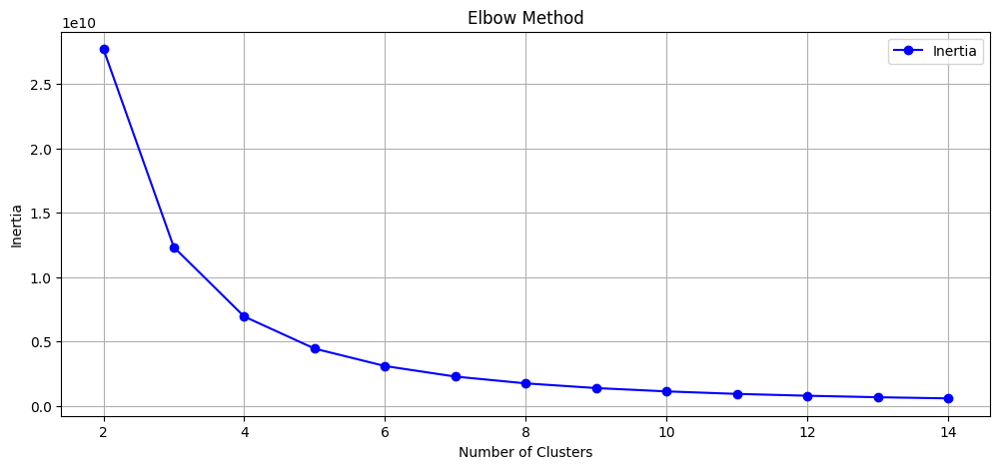

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), inertia, 'o-', label='Inertia', color='blue')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

**Silhouette Scores Graph**:
   - The graph shows the silhouette score for different cluster counts, with the highest score at `k=2` but still a reasonable value at `k=3`.

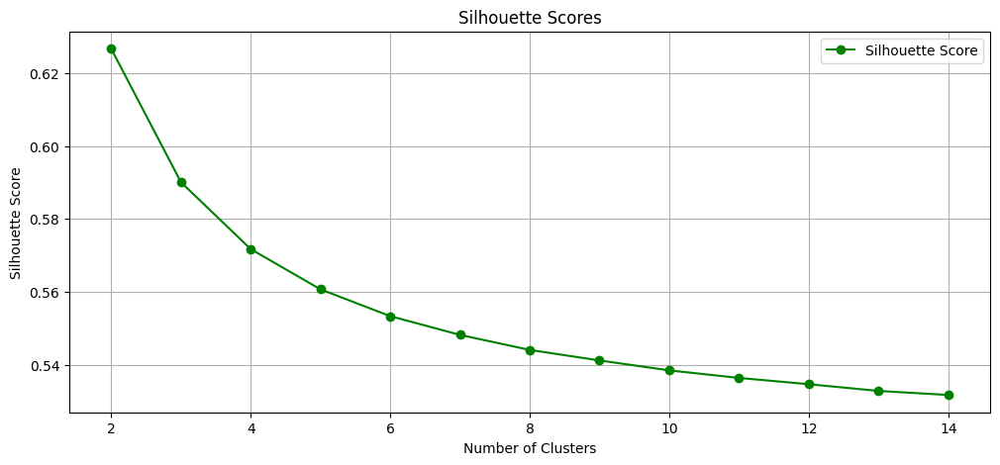

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), silhouette_scores, 'o-', label='Silhouette Score', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()

**Clustering with K=3**:
   - Based on the Elbow and Silhouette graphs, `k=3` clusters are chosen for analysis.
   - The KMeans algorithm assigns each data point to one of the 3 clusters and calculates their centroids.


In [ ]:
optimal_clusters = 3
kmn = KMeans(n_clusters=optimal_clusters, random_state=79)
kmeans_labels = kmn.fit_predict(df_numeric_scaled)
kmeans_centers = kmn.cluster_centers_

print(f'The Inertia for KMeans with {optimal_clusters} Clusters is: {kmn.inertia_}')
print(f'The Silhouette Score for KMeans with {optimal_clusters} Clusters is: {silhouette_score(df_numeric_scaled, kmeans_labels)}')

The Inertia for KMeans with 3 Clusters is: 12321217148.163248
The Silhouette Score for KMeans with 3 Clusters is: 0.5900791304531786


**Cluster Sizes**:
   - The clusters sizes shows that clusters are balanced:
     - **Cluster 0**: 3667 samples
     - **Cluster 1**: 3653 samples
     - **Cluster 2**: 3679 samples

In [ ]:
cluster_sizes = np.unique(kmeans_labels, return_counts=True)
print(cluster_sizes)
for cliuster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cliuster}: {size} samples')

(array([0, 1, 2], dtype=int32), array([3667, 3653, 3679]))
Cluster 0: 3667 samples
Cluster 1: 3653 samples
Cluster 2: 3679 samples


**Cluster Visualization**:
   - The scatter plot visualizes `Cost_of_the_Product` vs. `Discount_offered`, with points colored by their cluster label.
   - Red **<font color="red">X</font>** markers indicate the cluster centroids.

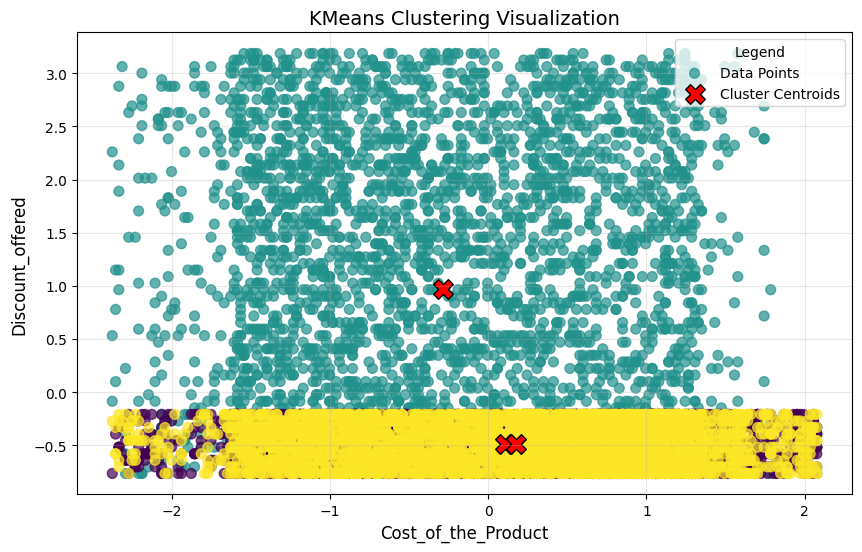

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df_numeric_scaled.iloc[:, 3], df_numeric_scaled.iloc[:, 6], c=kmeans_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(kmeans_centers[:, 3], kmeans_centers[:, 6], marker='X', s=200, c='red', label='Cluster Centroids', edgecolors='black')

plt.title('KMeans Clustering Visualization', fontsize=14)
plt.xlabel(df_numeric_scaled.columns[3], fontsize=12)
plt.ylabel(df_numeric_scaled.columns[6], fontsize=12)
plt.legend(title='Legend', fontsize=10)
plt.grid(alpha=0.3)
plt.show()

##Results and Insights

**Inertia and Silhouette Score**:
   - The inertia for `k=3` is **12,321,217,148.16**, indicating compact clusters.
   - The silhouette score of 0.59 suggests reasonably well-separated clusters but with slight overlaps.

**Cluster Characteristics**:
   - The clusters seem distinct in terms of `Cost_of_the_Product` and `Discount_offered`.
   - Cluster centroids provide an average representation of the cluster in the feature space.

**Balanced Clusters**:
   - The three clusters have approximately equal sizes, suggesting no significant dominance of one cluster over the others.

The KMeans algorithm successfully grouped the data into 3 clusters based on patterns in the scaled numeric dataset. These clusters can be further analyzed to derive actionable insights, such as:

- Understanding the relationship between `Cost_of_the_Product` and `Discount_offered`.
- Identifying characteristics of customers or products within each cluster for targeted strategies.

# K-Medoids

KMedoids is an unsupervised clustering algorithm, it is similar to KMeans but is more effective to outliers. Instead of using the mean (as in KMeans), KMedoids selects actual data points (medoids which are based on the median) as the centers of the clusters, minimizing the sum of dissimilarities between data points and their assigned medoid.

This makes KMedoids particularly effective for datasets with noise or outliers.

In [ ]:
! pip install scikit-learn-extra

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 17.5 MB/s eta 0:00:00


In [ ]:
from sklearn_extra.cluster import KMedoids

###**Elbow Method**:
**Intertia**
   - The **inertia** (sum of dissimilarities) is calculated for clusters ranging from 2 to 14.

**Silhouette Scores**:
   - The **silhouette score** measures the quality of the clustering. A higher score indicates well-separated clusters.
   - The silhouette score is calculated for each `k` (from 2 to 14).

In [ ]:
inertia = []
silhouette_scores = []

for k in range(2, 15):
    kmedoids = KMedoids(n_clusters=k, random_state=79)
    kmedoids.fit(df_numeric_scaled)
    inertia.append(kmedoids.inertia_)
    silhouette_scores.append(silhouette_score(df_numeric_scaled, kmedoids.labels_))

**Elbow Method Graph**:   
   - The Elbow Method graph helps identify the optimal number of clusters by observing where the inertia curve flattens. In this case, the optimal `k` appears around **3 clusters**.

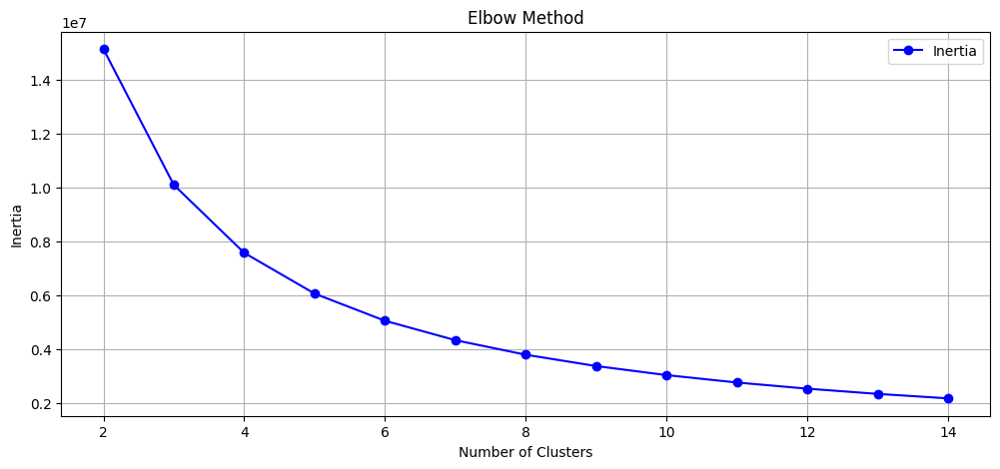

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), inertia, 'o-', label='Inertia', color='blue')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

**Silhouette Scores Graph**:
   - The graph shows the silhouette score for different cluster counts, and the highest score at `k=3`.

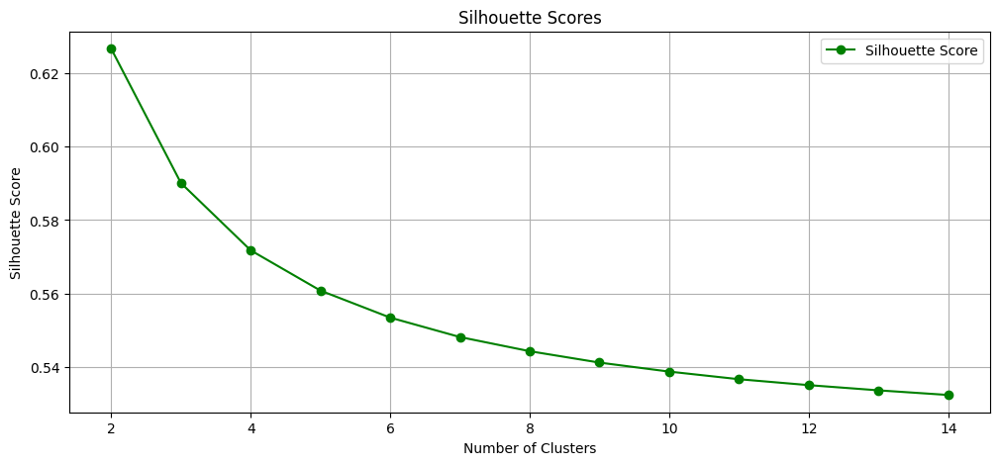

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(range(2, 15), silhouette_scores, 'o-', label='Silhouette Score', color='green')
plt.title('Silhouette Scores')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()

**Clustering with K=3**:
   - The dataset was clustered into 3 groups using KMedoids.
   - Each data point was assigned to the nearest medoid, and the medoids were updated iteratively to minimize dissimilarity.

In [ ]:
optimal_clusters = 3
kmed = KMedoids(n_clusters=optimal_clusters, random_state=79)
kmedoid_labels = kmed.fit_predict(df_numeric_scaled)
kmedoid_centers = kmed.cluster_centers_

print(f'The Inertia for KMedoids with {optimal_clusters} Clusters is: {kmed.inertia_}')
print(f'The Silhouette Score for KMedoids with {optimal_clusters} Clusters is: {silhouette_score(df_numeric_scaled, kmedoid_labels)}')

The Inertia for KMedoids with 3 Clusters is: 10081830.17427972
The Silhouette Score for KMedoids with 3 Clusters is: 0.590081885197549


**Cluster Sizes**:
   - The clusters sizes shows that clusters are balanced:
     - **Cluster 0**: 3667 samples
     - **Cluster 1**: 3653 samples
     - **Cluster 2**: 3679 samples

In [ ]:
cluster_sizes = np.unique(kmedoid_labels, return_counts=True)
print(cluster_sizes)
for cliuster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cliuster}: {size} samples')

(array([0, 1, 2]), array([3664, 3667, 3668]))
Cluster 0: 3664 samples
Cluster 1: 3667 samples
Cluster 2: 3668 samples


**Cluster Visualization**:
   - The scatter plot visualizes `Cost_of_the_Product` vs. `Discount_offered`, with points colored by their cluster label.
   - Red **<font color="red">X</font>** markers represent the medoids of each cluster.

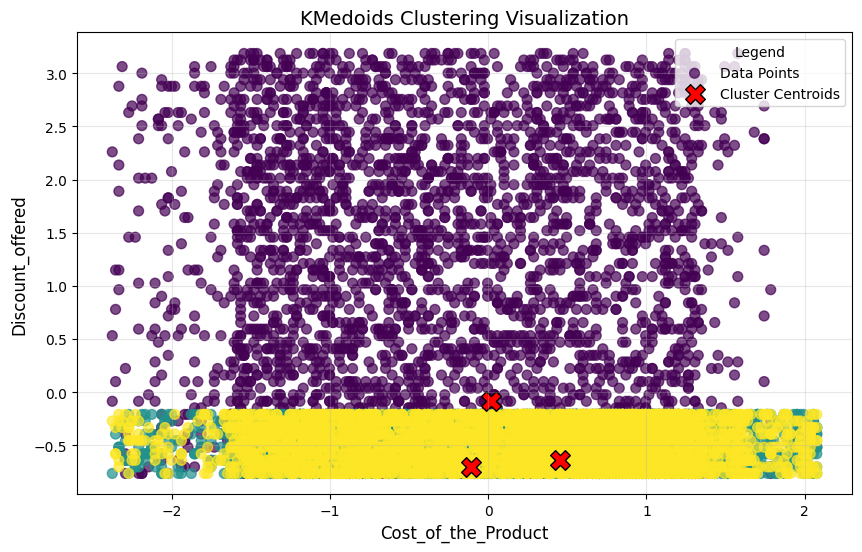

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df_numeric_scaled.iloc[:, 3], df_numeric_scaled.iloc[:, 6], c=kmedoid_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(kmedoid_centers[:, 3], kmedoid_centers[:, 6], marker='X', s=200, c='red', label='Cluster Centroids', edgecolors='black')

plt.title('KMedoids Clustering Visualization', fontsize=14)
plt.xlabel(df_numeric_scaled.columns[3], fontsize=12)
plt.ylabel(df_numeric_scaled.columns[6], fontsize=12)
plt.legend(title='Legend', fontsize=10)
plt.grid(alpha=0.3)
plt.show()

## Results and Insights

**Inertia and Silhouette Score**:
   - The **inertia** for `k=3` is **10,081,830.17**, showing compact clusters.
   - The **silhouette score** of **0.59** indicates reasonably well-separated clusters.

**Cluster Characteristics**:
   - The clusters exhibit distinct separations in terms of `Cost_of_the_Product` and `Discount_offered`.
   - Medoids are actual data points, making them interpretable representatives of each cluster.

**Balanced Clusters**:
   - The clusters are approximately equal in size, ensuring no cluster dominates the dataset.

The KMedoids algorithm successfully clustered the dataset into 3 groups, providing robust and interpretable clusters. These clusters can be analyzed further to:

- Understand customer segmentation based on purchasing behavior (`Cost_of_the_Product`) and discounts (`Discount_offered`).
- Develop targeted strategies or recommendations for each customer group.

This analysis highlights the robustness of KMedoids for handling noise and outliers while maintaining interpretable cluster medoids.

# DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is an unsupervised clustering algorithm that groups data points based on their density in the feature space. Unlike KMeans or KMedoids, DBSCAN does not require specifying the number of clusters beforehand. It relies on two main parameters:

- **`eps` (epsilon)**: The maximum distance within which data points are considered neighbors, in other words the radius of the cluster circle.  
- **`min_samples`**: The minimum number of data required to form a dense cluster.

DBSCAN identifies:
- **Core Points**: Points with at least `min_samples` neighbors within `eps`.
- **Border Points**: Points within `eps` of a core point but not satisfying `min_samples`.
- **Noise Points**: Points that do not belong to any cluster.

In [ ]:
from sklearn.cluster import DBSCAN

**K-Distance Plot**:
   - A K-Distance plot is created to determine an appropriate value for `eps`. The "elbow point" on the plot around `eps = 5` is chosen as a good starting value for clustering.


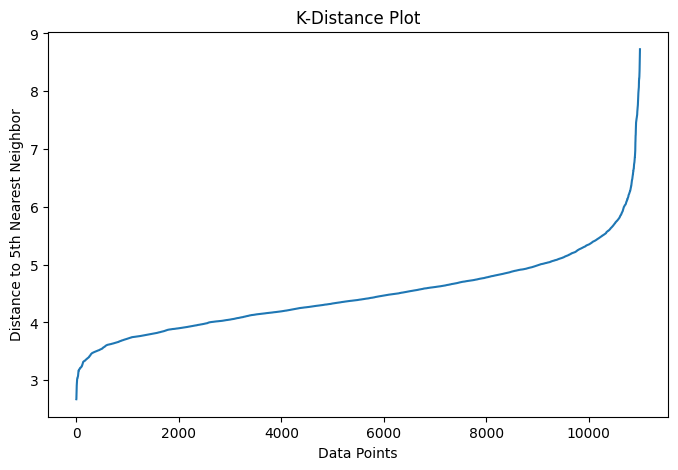

In [ ]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(df_numeric_scaled)
distances, indices = neighbors_fit.kneighbors(df_numeric_scaled)

distances = np.sort(distances[:, 4])
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.title('K-Distance Plot')
plt.xlabel('Data Points')
plt.ylabel('Distance to 5th Nearest Neighbor')
plt.show()


**Grid Search for `eps` and `min_samplesare**
   - Multiple combinations of `eps` and `are` are tested.
   - Scatter plots for each combination are generated to visualize the clusters, helping identify suitable parameters for DBSCAN.

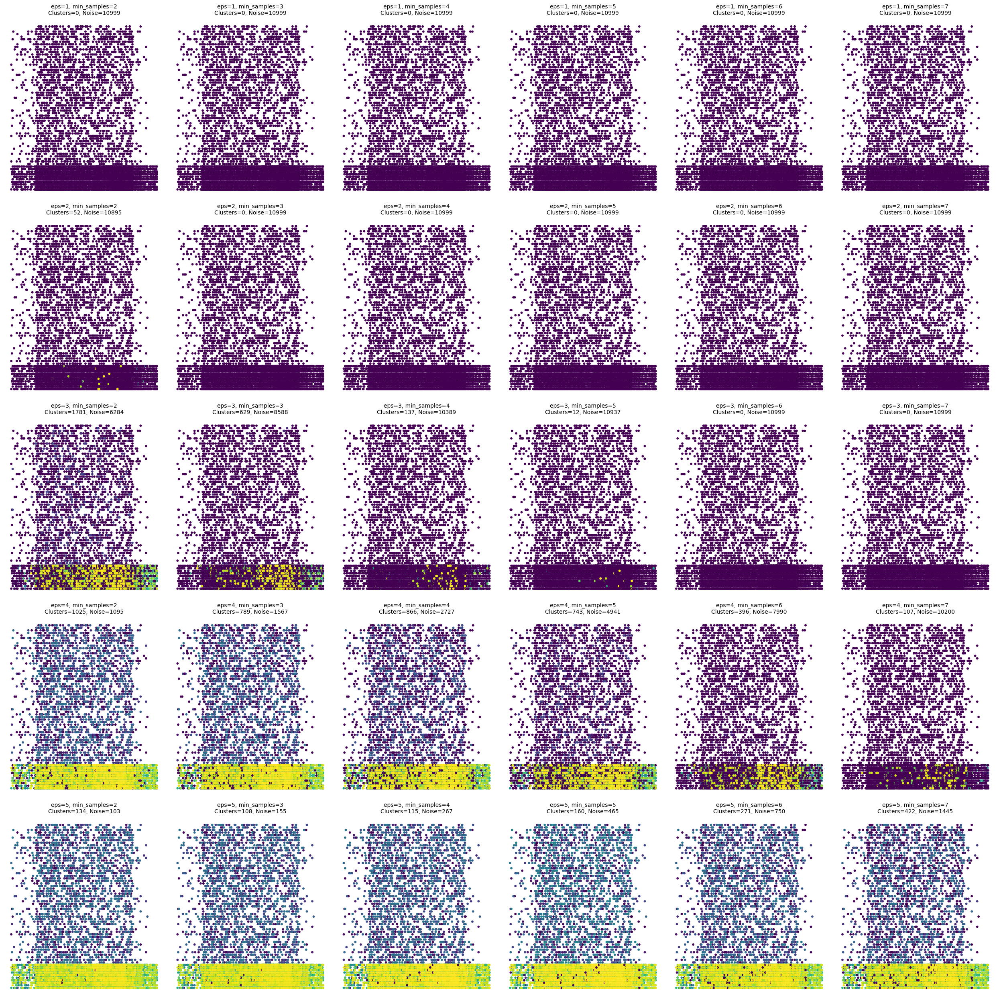

In [ ]:
eps_values = np.arange(1, 6, 1)
min_samples_values = range(2, 8)

fig, axs = plt.subplots(len(eps_values), len(min_samples_values), figsize=(25, 25))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan.fit(df_numeric_scaled)
        labels = dbscan.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise = list(labels).count(-1)

        axs[i, j].scatter(df_numeric_scaled.iloc[:, 3], df_numeric_scaled.iloc[:, 6], c=labels, cmap='viridis', s=10)
        axs[i, j].set_title(f'eps={eps}, min_samples={min_samples}\nClusters={n_clusters}, Noise={n_noise}', fontsize=10)
        axs[i, j].axis('off')

plt.tight_layout()
plt.show()

**Final DBSCAN Configuration**:
   - Based on visual analysis, the parameters `eps = 5` and `min_samples = 6` are selected.
   - DBSCAN is run on the preprocessed dataset with these values.

In [ ]:
min_samples = 6
eps = 5
dbs_shipping = DBSCAN(min_samples=min_samples, eps=eps)

dbs_shipping.fit(df_numeric_scaled)
best_labels = dbs_shipping.labels_


**Evaluation**:
   - The number of clusters and noise points are calculated:
     - **271 Clusters**
     - **750 Noise Points**
   - The Silhouette Score is calculated to measure cluster quality:
     - A silhouette score of **0.1979** indicates that the clusters have some overlap and are less compact than ideal.


In [ ]:
shipping_dbs_sil = silhouette_score(df_numeric_scaled, best_labels)

print(f'The Silhouette Score for DBSCAN with eps={eps} and min_samples={min_samples} is: {shipping_dbs_sil}')

The Silhouette Score for DBSCAN with eps=5 and min_samples=6 is: 0.19786156888016965


**Visualization**:
   - The catter plot shows clusters distributed across the feature space (`Cost_of_the_Product` vs. `Discount_offered`), with distinct groupings but noticeable noise.


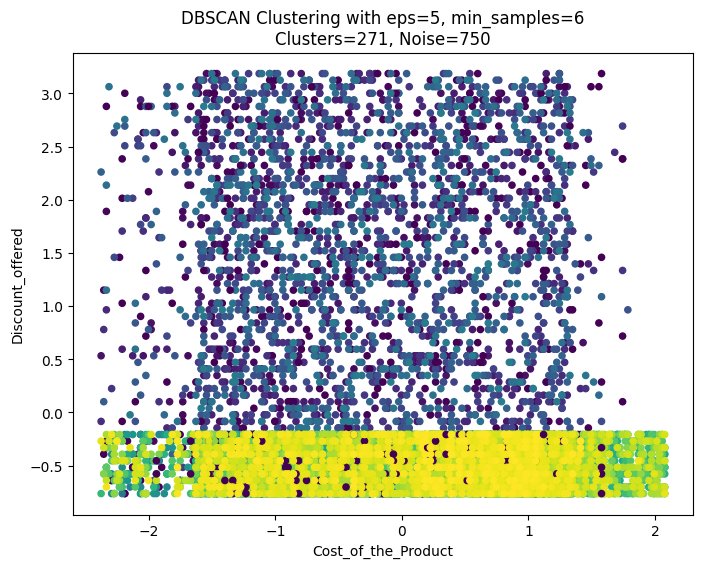

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df_numeric_scaled.iloc[:, 3], df_numeric_scaled.iloc[:, 6], c=best_labels, cmap='viridis', s=20)
plt.title(f"DBSCAN Clustering with eps={eps}, min_samples={min_samples}\nClusters={n_clusters_best}, Noise={list(best_labels).count(-1)}")
plt.xlabel(df_numeric_scaled.columns[3])
plt.ylabel(df_numeric_scaled.columns[6])
plt.show()


## Results and Insights

**Clusters and Noise Points**:
   - DBSCAN identified **271 clusters**, indicating fine-grained groupings in the dataset.
   - A significant number of noise points (**750**) were detected, which might indicate outliers or sparse regions in the data.

**Silhouette Score**:
   - A silhouette score of **0.1979** suggests that:
     - The clusters have some overlap or inconsistent density.
     - DBSCAN may not be the optimal algorithm for this dataset due to its density-based nature.

While DBSCAN successfully identified a large number of clusters and noise points, the low silhouette score suggests that these clusters are not well-separated or compact. This could be due to:
- Variability in the density of the dataset.
- Overly sensitive parameter settings.


# Mean Shift

Mean Shift is an unsupervised clustering algorithm that identifies clusters by shifting data points towards the densest areas of the feature space, called 'modes'. It does not require specifying the number of clusters beforehand and is particularly useful for datasets with varying cluster shapes or densities.

Key Parameter:
- **Bandwidth**: The radius around each point used to define density. A higher bandwidth creates fewer, larger clusters, while a lower bandwidth creates more clusters.


In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth

**Optimal Bandwidth Calculation**:
   - The optimal bandwidth was determined using `estimate_bandwidth`, which automatically selects the best radius for Mean Shift based on the dataset's density distribution.
   - The calculated bandwidth was **1208.92**, ensuring meaningful clusters.


In [ ]:
bandwidth = estimate_bandwidth(df_numeric_scaled, quantile=0.2)
print(f'Optimal Bandwidth: {bandwidth:.2f}')

Optimal Bandwidth: 1208.92


 **Mean Shift Clustering**:
   - Mean Shift was applied to the preprocessed dataset, automatically determining **8 clusters** based on the data's density.
   - Cluster centers (red X markers) represent the densest points in the feature space.

In [ ]:
ms = MeanShift(bandwidth=bandwidth)
ms.fit(df_numeric_scaled)
ms_labels = ms.predict(df_numeric_scaled)
ms_cluster_centers = ms.cluster_centers_

**Evaluation Metrics**:
   - **Inertia**: A measure of cluster compactness. The inertia for Mean Shift was **2,399,079,391.97**. Lower inertia values indicate tighter, more compact clusters.
   - **Silhouette Score**: A measure of cluster quality that ranges from -1 to 1:
     - A score of **0.5326** indicates moderately compact and well-separated clusters.


In [ ]:
def compute_inertia(df, labels, centers):
    inertia = 0
    for i, label in enumerate(labels):
        center = centers[label]
        point = df.iloc[i, :]
        inertia += np.sum((point - center) ** 2)
    return inertia

In [ ]:
ms_inert = compute_inertia(df_numeric_scaled, ms_labels, ms_cluster_centers)
ms_sil = silhouette_score(df_numeric_scaled, ms_labels)
n_clusters = len(np.unique(ms_labels))

print(f'Number of Clusters: {n_clusters}')
print(f'The Inertia for Mean Shift is: {ms_inert}')
print(f'The Silhouette Score for Mean Shift is: {ms_sil:}')

Number of Clusters: 8
The Inertia for Mean Shift is: 2399079391.972909
The Silhouette Score for Mean Shift is: 0.5326051966487105


**Cluster Sizes**:
   - The clusters are fairly balanced in size:
     - **Cluster 0**: 1813 samples
     - **Cluster 1-6**: 1209 samples each
     - **Cluster 7**: 1932 samples

In [ ]:
cluster_sizes = np.unique(ms_labels, return_counts=True)
for cluster, size in zip(cluster_sizes[0], cluster_sizes[1]):
    print(f'Cluster {cluster}: {size} samples')

Cluster 0: 1813 samples
Cluster 1: 1209 samples
Cluster 2: 1209 samples
Cluster 3: 1209 samples
Cluster 4: 1209 samples
Cluster 5: 1209 samples
Cluster 6: 1209 samples
Cluster 7: 1932 samples


**Visualization**:
   - The scatter plot visualizes clusters in the feature space (`Cost_of_the_Product` vs. `Discount_offered`), with distinct colors representing each cluster.
   - Cluster centers are marked with red **<font color="red">X</font>**  markers.

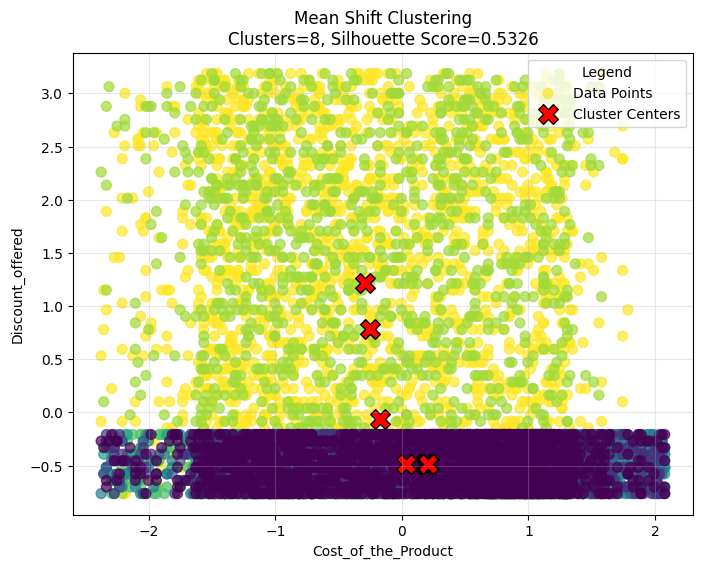

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df_numeric_scaled.iloc[:, 3], df_numeric_scaled.iloc[:, 6], c=ms_labels, cmap='viridis', s=50, alpha=0.7, label='Data Points')
plt.scatter(ms_cluster_centers[:, 3], ms_cluster_centers[:, 6], marker='X', s=200, c='red', label='Cluster Centers', edgecolors='black')
plt.title(f'Mean Shift Clustering\nClusters={n_clusters}, Silhouette Score={ms_sil:.4f}')
plt.xlabel(df_numeric_scaled.columns[3])
plt.ylabel(df_numeric_scaled.columns[6])
plt.legend(title='Legend')
plt.grid(alpha=0.3)
plt.show()


## Results and Insights
**Number of Clusters**:
   - Mean Shift identified **8 clusters** without requiring prior specification. This demonstrates its ability to adapt to the dataset's structure.

**Cluster Quality**:
   - The **silhouette score of 0.5326** suggests moderately compact and well-separated clusters.
   - The **inertia value** indicates that the clusters are reasonably tight.

**Cluster Distribution**:
   - The cluster sizes are fairly balanced, with clusters containing between **1209 and 1932 samples**. This balance suggests consistent density across the feature space.

**Interpretation**:
   - The clusters provide insight into relationships between `Cost_of_the_Product` and `Discount_offered`. For example, Cluster 0 (largest cluster) might represent customers with high-density purchasing behaviors.

   Mean Shift successfully identified 8 meaningful clusters with moderately good separation. This clustering approach is useful for uncovering natural groupings in the dataset without predefining the number of clusters.
   
   However, the relatively moderate silhouette score suggests that further exploration with alternative algorithms like KMeans or KMedoids might yield better-defined clusters depending on the use case.